In [1]:
# сделаем необходимые импорты

# так как я не знаю до конца структуру данных, которые я буду получать, сделаю более широкое отображение колонок
# на всякий случай ограничу их 300 колонками



# данные для исследований будут взяты через Апи ключ с ресурса fred.stlouisfed.org/

# если вы не установили fredapi, то это можно сделать через команду pip install fredapi в командной строке
# всё просто, после этого можно сделать его импорт
# на всякий случай, оставлю ссылку - https://pypi.org/project/fredapi/
# ниже будет указана информация про получении Апи ключа

# https://fred.stlouisfed.org/
# экономические данные Федеральной резервной системы — это база данных, 
# поддерживаемая исследовательским отделом Федерального резервного банка Сент-Луиса, 
# которая содержит более 816 000 экономических временных рядов из различных источников
# вам надо лишь определиться с интересующими вас данными, это можно сделать на сайте, а потом через запрос

# на этом ресурсе есть масса интересных метрик

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import plotly.express as px

pd.set_option('display.max_columns', 300)

from fredapi import Fred

In [3]:
# в этот раз хочу строить графики Матплотлиба в одном стиле
# давайте посмотрим на них

In [4]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

In [5]:
# я выбрал пастельные тона - seaborn-v0_8-pastel

In [6]:
plt.style.use('seaborn-v0_8-pastel')
color_palette = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [7]:
# для взаимодействий вам нужно получить Апи ключ
# ссылка - https://fred.stlouisfed.org/docs/api/api_key.html
# далее вам надо его вставить в ваш запрос

# чтобы не показывать свой ключ, я сохранил его в отдельный файл и буду производить его чтение

In [8]:
fred_key = open(r'api.txt')

In [9]:
fred = Fred(api_key = fred_key.readline())
fred

In [10]:
# в мануале предлагают начать с индекса S&P500, что я и сделаю, но найду его через поиск, а не получу серию через ай ди
# синтаксис несложный, через search найдем S&P, доп сортировку сделаем по колонке популярность

# видим в колонке id SP500

In [11]:
sp_fred = fred.search('S&P', order_by = 'popularity')
sp_fred.shape

(1000, 15)

In [12]:
sp_fred

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2024-01-13,2024-01-13,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2024-01-11,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-01-12 09:23:06-06:00,93,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2024-01-13,2024-01-13,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2023-10-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2023-12-26 08:12:02-06:00,87,"For more information regarding the index, plea..."
SP500,SP500,2024-01-13,2024-01-13,S&P 500,2014-01-13,2024-01-12,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2024-01-12 19:11:08-06:00,83,The observations for the S&P 500 represent the...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2024-01-13,2024-01-13,ICE BofA US High Yield Index Effective Yield,1996-12-31,2024-01-11,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-01-12 09:23:09-06:00,82,This data represents the effective yield of th...
MEHOINUSA672N,MEHOINUSA672N,2024-01-13,2024-01-13,Real Median Household Income in the United States,1984-01-01,2022-01-01,Annual,A,2022 CPI-U-RS Adjusted Dollars,2022 CPI-U-RS Adjusted $,Not Seasonally Adjusted,NSA,2023-09-12 13:48:02-05:00,82,Household data are collected as of March. As ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CSHXCPNAA156NRUG,CSHXCPNAA156NRUG,2024-01-13,2024-01-13,Share of Merchandise Exports at Current Purcha...,1960-01-01,2019-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2021-11-08 13:37:04-06:00,3,Source ID: csh_x When using these data in you...
CSHRCPQAA156NRUG,CSHRCPQAA156NRUG,2024-01-13,2024-01-13,Share of Residual Trade and GDP Statistical Di...,1970-01-01,2019-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2021-11-08 13:32:26-06:00,3,Source ID: csh_r When using these data in you...
DDEM01AMA156NWDB,DDEM01AMA156NWDB,2024-01-13,2024-01-13,Stock Market Turnover Ratio (Value Traded/Capi...,2001-01-01,2012-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2018-09-21 11:27:22-05:00,3,Total value of shares traded during the period...


In [13]:
# запросим отдельную серию по SP500 и построим график, данные есть в колонке id
# всё работает

In [14]:
sp500 = fred.get_series(series_id = 'SP500')
sp500

2014-01-13    1819.20
2014-01-14    1838.88
2014-01-15    1848.38
2014-01-16    1845.89
2014-01-17    1838.70
               ...   
2024-01-08    4763.54
2024-01-09    4756.50
2024-01-10    4783.45
2024-01-11    4780.24
2024-01-12    4783.83
Length: 2610, dtype: float64

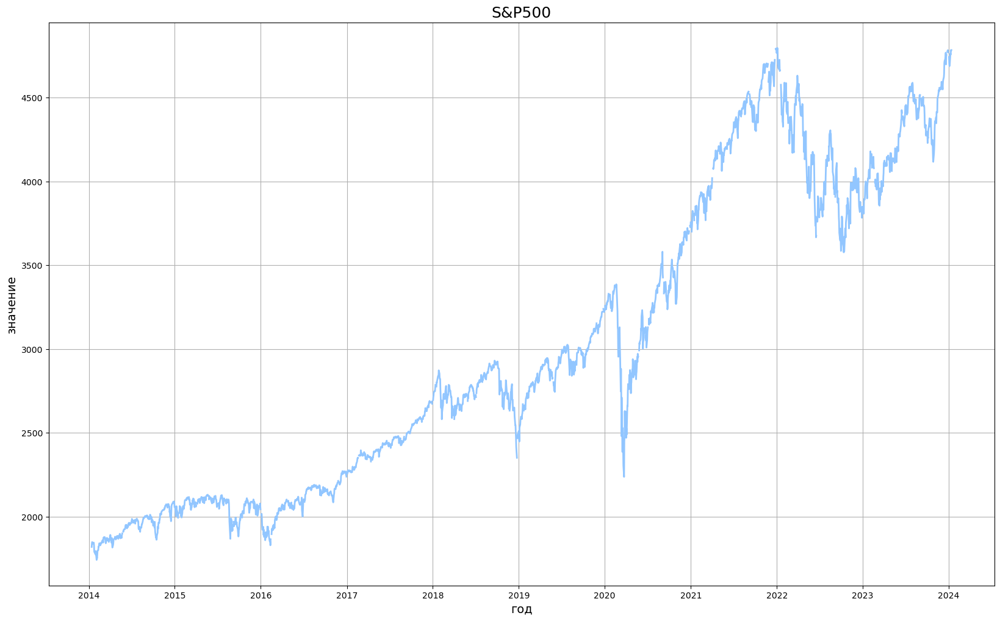

In [15]:
plt.figure(figsize = (20, 12))

plt.title('S&P500', size = 18)
plt.plot(sp500, linewidth= 2)
plt.grid(True)
plt.xlabel('год', size = 14)
plt.ylabel('значение', size = 14)
plt.show()

In [16]:
# давайте сделаем другой запрос, попробуем найти данные, которые связаны с безработицей в США
# первая записть UNRATE, давайте посмотрим на нее отдельно

In [17]:
unmp_fred = fred.search('unemployment')
unmp_fred

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-01-13,2024-01-13,Unemployment Rate,1948-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:02-06:00,94,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-01-13,2024-01-13,Unemployment Rate,1948-01-01,2023-12-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 07:45:29-06:00,55,The unemployment rate represents the number of...
CCSA,CCSA,2024-01-13,2024-01-13,Continued Claims (Insured Unemployment),1967-01-07,2023-12-30,"Weekly, Ending Saturday",W,Number,Number,Seasonally Adjusted,SA,2024-01-11 07:33:05-06:00,75,"Continued claims, also referred to as insured ..."
CCNSA,CCNSA,2024-01-13,2024-01-13,Continued Claims (Insured Unemployment),1967-01-07,2023-12-30,"Weekly, Ending Saturday",W,Number,Number,Not Seasonally Adjusted,NSA,2024-01-11 07:33:11-06:00,40,"Continued claims, also referred to as insured ..."
UNEMPLOY,UNEMPLOY,2024-01-13,2024-01-13,Unemployment Level,1948-01-01,2023-12-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-01-12 10:28:18-06:00,68,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LMUNRRTTPLA156S,LMUNRRTTPLA156S,2024-01-13,2024-01-13,Other Labor Market Measures: Registered Unempl...,1990-01-01,2022-01-01,Annual,A,Percent,%,Seasonally Adjusted,SA,2023-03-15 13:32:52-05:00,1,OECD Descriptor ID: LMUNRRTT OECD unit ID: PC ...
LMUNRRTTPLA156N,LMUNRRTTPLA156N,2024-01-13,2024-01-13,Other Labor Market Measures: Registered Unempl...,1990-01-01,2022-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2023-03-15 13:32:52-05:00,1,OECD Descriptor ID: LMUNRRTT OECD unit ID: PC ...
MILW355UR,MILW355UR,2024-01-13,2024-01-13,Unemployment Rate in Milwaukee-Waukesha-West A...,1990-01-01,2023-11-01,Monthly,M,Percent,%,Smoothed Seasonally Adjusted,SSA,2024-01-05 14:54:41-06:00,1,None


In [18]:
# получим серию и посроим график

In [19]:
unrate = fred.get_series(series_id = 'UNRATE')
unrate

1948-01-01    3.4
1948-02-01    3.8
1948-03-01    4.0
1948-04-01    3.9
1948-05-01    3.5
             ... 
2023-08-01    3.8
2023-09-01    3.8
2023-10-01    3.8
2023-11-01    3.7
2023-12-01    3.7
Length: 912, dtype: float64

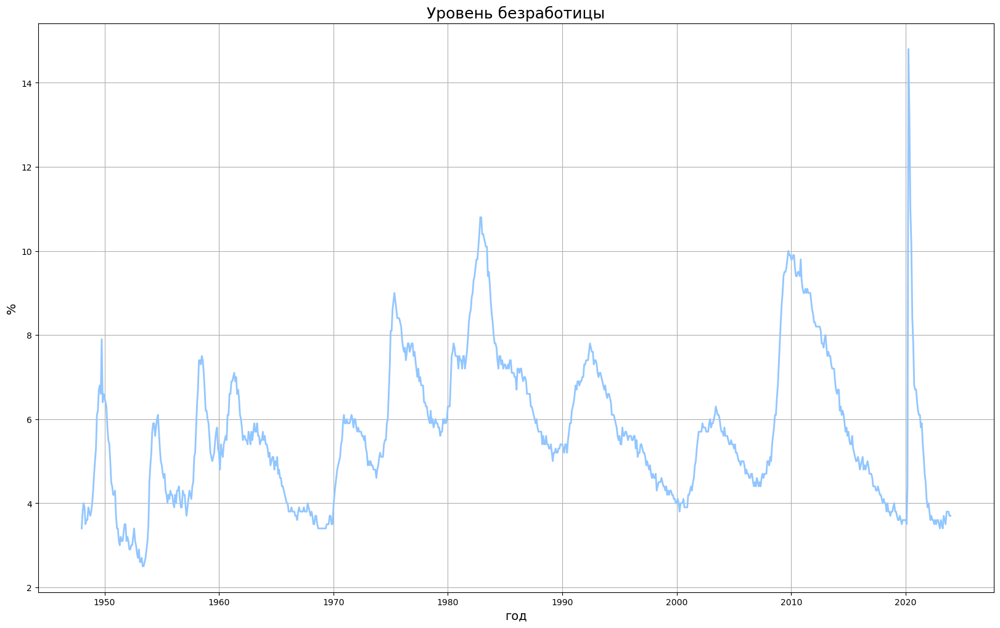

In [20]:
plt.figure(figsize = (20, 12))

plt.title('Уровень безработицы', size = 18)
plt.plot(unrate, linewidth= 2)
plt.grid(True)
plt.xlabel('год', size = 14)
plt.ylabel('%', size = 14)
plt.show()

In [21]:
# давайте посмотрим на уникальные названия в нашем последнем запросе
# можно заметить массу данных, которые посвящены штатам США

# давайте на этом сконцентрируемся

In [22]:
unmp_fred['title'].unique()

array(['Unemployment Rate', 'Continued Claims (Insured Unemployment)',
       'Unemployment Level', 'Noncyclical Rate of Unemployment',
       'Unemployment Rate - Black or African American',
       'Total Unemployed, Plus All Persons Marginally Attached to the Labor Force, Plus Total Employed Part Time for Economic Reasons, as a Percent of the Civilian Labor Force Plus All Persons Marginally Attached to the Labor Force (U-6)',
       'Unemployment Rate in California',
       'Natural Rate of Unemployment (Short-Term) (DISCONTINUED)',
       'Unemployment Rate for United States',
       'Unemployment Rate - 20 Yrs. & over',
       'Unemployment Rate - Job Losers (U-2)',
       '4-Week Moving Average of Continued Claims (Insured Unemployment)',
       'Unemployment Rate in Texas',
       'Unemployment Level - Permanent Job Losers',
       'Unemployment Rate - 20 Yrs. & over, Black or African American Men',
       'Unemployment Rate in Florida',
       'Unemployment Rate: Aged 15 and ove

In [23]:
# давайте отфильтруем наш запрос по ежемесячной частоте предоставления данных

In [24]:
fred.search('unemployment state', filter = ('frequency', 'Monthly'))

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-01-13,2024-01-13,Unemployment Rate,1948-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:02-06:00,94,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-01-13,2024-01-13,Unemployment Rate,1948-01-01,2023-12-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 07:45:29-06:00,55,The unemployment rate represents the number of...
UNEMPLOY,UNEMPLOY,2024-01-13,2024-01-13,Unemployment Level,1948-01-01,2023-12-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-01-12 10:28:18-06:00,68,The series comes from the 'Current Population ...
LNS14000006,LNS14000006,2024-01-13,2024-01-13,Unemployment Rate - Black or African American,1972-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:18-06:00,67,The series comes from the 'Current Population ...
LNU03000000,LNU03000000,2024-01-13,2024-01-13,Unemployment Level,1948-01-01,2023-12-01,Monthly,M,Thousands of Persons,Thous. of Persons,Not Seasonally Adjusted,NSA,2024-01-05 07:45:54-06:00,21,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TXORAN5URN,TXORAN5URN,2024-01-13,2024-01-13,"Unemployment Rate in Orange County, TX",1990-01-01,2023-11-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 10:36:15-06:00,3,These data come from the Current Population Su...
TXGRAY9URN,TXGRAY9URN,2024-01-13,2024-01-13,"Unemployment Rate in Gray County, TX",1990-01-01,2023-11-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 10:41:11-06:00,3,These data come from the Current Population Su...
WICH620UR,WICH620UR,2024-01-13,2024-01-13,"Unemployment Rate in Wichita, KS (MSA)",1990-01-01,2023-11-01,Monthly,M,Percent,%,Smoothed Seasonally Adjusted,SSA,2024-01-05 14:54:10-06:00,3,None


In [25]:
# обновим ДФ

In [26]:
unmp_df = fred.search('unemployment rate state', filter = ('frequency', 'Monthly'))
unmp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-01-13,2024-01-13,Unemployment Rate,1948-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:02-06:00,94,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-01-13,2024-01-13,Unemployment Rate,1948-01-01,2023-12-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 07:45:29-06:00,55,The unemployment rate represents the number of...
UNEMPLOY,UNEMPLOY,2024-01-13,2024-01-13,Unemployment Level,1948-01-01,2023-12-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-01-12 10:28:18-06:00,68,The series comes from the 'Current Population ...
LNS14000006,LNS14000006,2024-01-13,2024-01-13,Unemployment Rate - Black or African American,1972-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:18-06:00,67,The series comes from the 'Current Population ...
LNU04000006,LNU04000006,2024-01-13,2024-01-13,Unemployment Rate - Black or African American,1972-01-01,2023-12-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 07:46:15-06:00,19,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OHBUTL2URN,OHBUTL2URN,2024-01-13,2024-01-13,"Unemployment Rate in Butler County, OH",1990-01-01,2023-11-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 10:16:09-06:00,4,These data come from the Current Population Su...
ILWMURN,ILWMURN,2024-01-13,2024-01-13,"Unemployment Rate in Williamson County, IL",1990-01-01,2023-11-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 10:26:06-06:00,4,These data come from the Current Population Su...
VAAUGU0URN,VAAUGU0URN,2024-01-13,2024-01-13,"Unemployment Rate in Augusta County, VA",1990-01-01,2023-11-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-01-05 10:35:04-06:00,4,These data come from the Current Population Su...


In [27]:
# отфильтруем ДФ, оставим только данные с учетом сезонных корректировок и в процентных единицах измерения

In [28]:
unmp_df = unmp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')
unmp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-01-13,2024-01-13,Unemployment Rate,1948-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:02-06:00,94,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2024-01-13,2024-01-13,Unemployment Rate - Black or African American,1972-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:18-06:00,67,The series comes from the 'Current Population ...
U6RATE,U6RATE,2024-01-13,2024-01-13,"Total Unemployed, Plus All Persons Marginally ...",1994-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:20-06:00,65,The series comes from the 'Current Population ...
CAUR,CAUR,2024-01-13,2024-01-13,Unemployment Rate in California,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:24:01-06:00,62,None
M0892AUSM156SNBR,M0892AUSM156SNBR,2024-01-13,2024-01-13,Unemployment Rate for United States,1929-04-01,1942-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:26:06-05:00,50,Series Is Presented Here As Three Variables--(...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LBSSA32,LBSSA32,2024-01-13,2024-01-13,Labor Force Participation Rate for Nevada,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-22 09:02:34-06:00,2,A state's labor-force participation rate is th...
CSOUUR,CSOUUR,2024-01-13,2024-01-13,Unemployment Rate in South Census Region,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:23:17-06:00,4,None
DSUR,DSUR,2024-01-13,2024-01-13,Unemployment Rate in FRB-St. Louis District St...,1976-01-01,2008-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2009-03-12 15:01:09-05:00,4,This series is calculated by FRB-St. Louis usi...


In [29]:
# в колонке title можно увидеть названия всех показателей

In [30]:
for i in unmp_df['title']:
    print(i)

Unemployment Rate
Unemployment Rate - Black or African American
Total Unemployed, Plus All Persons Marginally Attached to the Labor Force, Plus Total Employed Part Time for Economic Reasons, as a Percent of the Civilian Labor Force Plus All Persons Marginally Attached to the Labor Force (U-6)
Unemployment Rate in California
Unemployment Rate for United States
Unemployment Rate - 20 Yrs. & over
Unemployment Rate - Job Losers (U-2)
Unemployment Rate for United States
Unemployment Rate in Texas
Unemployment Rate - 20 Yrs. & over, Black or African American Men
Unemployment Rate in Florida
Unemployment Rate in New York
Unemployment Rate - Women
Unemployment Rate - Hispanic or Latino
Unemployment Rate - White
Unemployment Rate in Ohio
Unemployment Rate - High School Graduates, No College, 25 Yrs. & over
Unemployment Rate in Michigan
Unemployment Rate - Men
Unemployment Rate in Alabama
Percent of Civilian Labor Force Unemployed 15 Weeks and over (U-1)
Unemployment Rate - 16-24 Yrs.
Unemployme

In [31]:
# давайте оставим все названия показателей, в которых присутствует связка Unemployment Rate

In [32]:
unmp_df = unmp_df.loc[unmp_df['title'].str.contains('Unemployment Rate')]
unmp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-01-13,2024-01-13,Unemployment Rate,1948-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:02-06:00,94,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2024-01-13,2024-01-13,Unemployment Rate - Black or African American,1972-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-12 10:28:18-06:00,67,The series comes from the 'Current Population ...
CAUR,CAUR,2024-01-13,2024-01-13,Unemployment Rate in California,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:24:01-06:00,62,None
M0892AUSM156SNBR,M0892AUSM156SNBR,2024-01-13,2024-01-13,Unemployment Rate for United States,1929-04-01,1942-06-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-08-17 14:26:06-05:00,50,Series Is Presented Here As Three Variables--(...
LNS14000024,LNS14000024,2024-01-13,2024-01-13,Unemployment Rate - 20 Yrs. & over,1948-01-01,2023-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-01-05 07:45:32-06:00,53,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
USAURHARMMDSMEI,USAURHARMMDSMEI,2024-01-13,2024-01-13,Harmonized Unemployment Rate: All Persons for ...,1955-01-01,2012-05-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2012-07-19 16:33:46-05:00,1,"Copyright, 2016, OECD. Reprinted with permissi..."
CSOUUR,CSOUUR,2024-01-13,2024-01-13,Unemployment Rate in South Census Region,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:23:17-06:00,4,None
DSUR,DSUR,2024-01-13,2024-01-13,Unemployment Rate in FRB-St. Louis District St...,1976-01-01,2008-12-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2009-03-12 15:01:09-05:00,4,This series is calculated by FRB-St. Louis usi...


In [33]:
# у нас остаются ненужные данные
# например, одна из записей - LNS14000006 или Unemployment Rate - Black or African American
# я хочу сохранить данные, которые относятся непосредственно к штатам США или максимально приближенные к ним

In [34]:
unmp_df['id'].unique()

array(['UNRATE', 'LNS14000006', 'CAUR', 'M0892AUSM156SNBR', 'LNS14000024',
       'U2RATE', 'M0892BUSM156SNBR', 'TXUR', 'LNS14000031', 'FLUR',
       'NYUR', 'LNS14000002', 'LNS14000009', 'LNS14000003', 'OHUR',
       'LNS14027660', 'MIUR', 'LNS14000001', 'ALUR', 'LNS14024887',
       'NJUR', 'ILUR', 'LNS14027662', 'GAUR', 'COUR', 'NCUR', 'PAUR',
       'AZUR', 'MNUR', 'KYUR', 'WIUR', 'LRUN64TTUSM156S', 'MAUR',
       'LNS14000012', 'SCUR', 'LNS14032183', 'WAUR', 'LAUR', 'VAUR',
       'MDUR', 'IAUR', 'ARUR', 'LNS14027659', 'TNUR', 'MOUR', 'INUR',
       'NVUR', 'UTUR', 'WVUR', 'ORUR', 'NMUR', 'OKUR', 'HIUR',
       'LASMT261982000000003', 'MTUR', 'CTUR', 'KSUR', 'AKUR', 'IDUR',
       'MEUR', 'MSUR', 'LNS14000060', 'PRUR', 'WYUR', 'NDUR', 'NEUR',
       'LNS14000028', 'DCUR', 'NHUR', 'LASMT391746000000003',
       'LNS14000036', 'DEUR', 'LNS14000018', 'RIUR', 'CMWRUR',
       'LNS14000032', 'SDUR', 'LNS14027689', 'VTUR', 'LRUN24TTUSM156S',
       'LNS14100000', 'LNS14024230', 'CNEWUR'

In [35]:
# в состав США входят 50 штатов и федеральный округ Колумбия (или DCUR)
# но узнать, что ещё можно отсеять, просто так не получится
# первые две буквы отвечают за штат, а вторые говорят, что это уровень безработицы

In [36]:
# основная масса ненужных значений укладывается в условие, что длина названия больше 4 элементов и в названии есть цифры
# можно было и без цифр в итоге, если детальнее рассмотреть индексы, но оставлю так
# реализую это ниже и пересохраню ДФ

# через цикл по колонке будем проверять условие и удалять ненужные записи

In [37]:
for col in unmp_df['id']:
    if (len(col) > 4) or (any(map(str.isdigit, col))):
        unmp_df = unmp_df.drop(col)
        
unmp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
CAUR,CAUR,2024-01-13,2024-01-13,Unemployment Rate in California,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:24:01-06:00,62,None
TXUR,TXUR,2024-01-13,2024-01-13,Unemployment Rate in Texas,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:23:03-06:00,51,None
FLUR,FLUR,2024-01-13,2024-01-13,Unemployment Rate in Florida,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:24:02-06:00,49,None
NYUR,NYUR,2024-01-13,2024-01-13,Unemployment Rate in New York,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:23:02-06:00,47,None
OHUR,OHUR,2024-01-13,2024-01-13,Unemployment Rate in Ohio,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:23:04-06:00,40,None
MIUR,MIUR,2024-01-13,2024-01-13,Unemployment Rate in Michigan,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:24:04-06:00,35,None
ALUR,ALUR,2024-01-13,2024-01-13,Unemployment Rate in Alabama,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:24:03-06:00,35,None
NJUR,NJUR,2024-01-13,2024-01-13,Unemployment Rate in New Jersey,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:23:11-06:00,20,None
ILUR,ILUR,2024-01-13,2024-01-13,Unemployment Rate in Illinois,1976-01-01,2023-11-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2023-12-28 15:24:05-06:00,27,None


In [38]:
# надо будет убрать ещё несколькот индексов, так как нам надо 50 + 1 штат

In [39]:
unmp_df.shape

(53, 15)

In [40]:
# я выяснил, что лишние данные - это Пуэрто-Рико (PRUR) и данные по Сент Луису (DSUR)
# в колонке title есть описание данных
# давайте уберем Пуэрто-Рико и Сент Луис

In [41]:
unmp_df = unmp_df.drop('PRUR')
unmp_df = unmp_df.drop('DSUR')
unmp_df.shape

(51, 15)

In [42]:
# теперь у нас есть нужные нам данные
# нам нужно получить серию данных через запрос к fred по каждому индексу из ДФа, в котором указан ай ди серии
# реализуем это в виде цикла
# для примера посмотрим на первый результат

In [43]:
for my_id in unmp_df.index:
    results = fred.get_series(my_id)
    break

In [44]:
results.to_frame(name = my_id)

,CAUR
1976-01-01,9.2
1976-02-01,9.2
1976-03-01,9.1
1976-04-01,9.1
1976-05-01,9.0
...,...
2023-07-01,4.6
2023-08-01,4.6
2023-09-01,4.7
2023-10-01,4.8


In [45]:
# сделаем накопление данных в переменную all_results

In [46]:
# все показатели по безработице в одном списке в виде отдельных серий
# реализуем это через цикл, который будет отправлять запрос по каждому ай ди
# далее это всё преобразовывается и именуется, после накапливается в списке

In [47]:
all_results = []

for my_id in unmp_df.index:
    results = fred.get_series(my_id)
    results = results.to_frame(name = my_id)
    all_results.append(results)

In [48]:
all_results

[            CAUR
 1976-01-01   9.2
 1976-02-01   9.2
 1976-03-01   9.1
 1976-04-01   9.1
 1976-05-01   9.0
 ...          ...
 2023-07-01   4.6
 2023-08-01   4.6
 2023-09-01   4.7
 2023-10-01   4.8
 2023-11-01   4.9
 
 [575 rows x 1 columns],
             TXUR
 1976-01-01   5.8
 1976-02-01   5.8
 1976-03-01   5.9
 1976-04-01   5.9
 1976-05-01   5.9
 ...          ...
 2023-07-01   4.1
 2023-08-01   4.1
 2023-09-01   4.1
 2023-10-01   4.1
 2023-11-01   4.1
 
 [575 rows x 1 columns],
             FLUR
 1976-01-01   9.7
 1976-02-01   9.7
 1976-03-01   9.6
 1976-04-01   9.5
 1976-05-01   9.3
 ...          ...
 2023-07-01   2.7
 2023-08-01   2.7
 2023-09-01   2.8
 2023-10-01   2.8
 2023-11-01   2.9
 
 [575 rows x 1 columns],
             NYUR
 1976-01-01  10.3
 1976-02-01  10.3
 1976-03-01  10.2
 1976-04-01  10.2
 1976-05-01  10.1
 ...          ...
 2023-07-01   3.9
 2023-08-01   3.9
 2023-09-01   4.0
 2023-10-01   4.2
 2023-11-01   4.3
 
 [575 rows x 1 columns],
             OHUR
 1976-01-0

In [49]:
# сделаем один ДФ из полученных данных, в индексах у нас даты отчетов
# дополнительно делаем настройку по оси, чтобы они шли друг за другом в ряд

In [50]:
unmp_states = pd.concat(all_results, axis = 1)
unmp_states

,CAUR,TXUR,FLUR,NYUR,OHUR,MIUR,ALUR,NJUR,ILUR,GAUR,COUR,NCUR,PAUR,AZUR,MNUR,KYUR,WIUR,MAUR,SCUR,WAUR,LAUR,VAUR,MDUR,IAUR,ARUR,TNUR,MOUR,INUR,NVUR,UTUR,WVUR,ORUR,NMUR,OKUR,HIUR,MTUR,CTUR,KSUR,AKUR,IDUR,MEUR,MSUR,WYUR,NDUR,NEUR,DCUR,NHUR,DEUR,RIUR,SDUR,VTUR
1976-01-01,9.2,5.8,9.7,10.3,8.1,9.9,6.6,10.3,6.6,8.4,5.8,6.4,8.0,10.2,6.0,5.6,5.8,10.5,7.4,8.5,6.3,6.1,6.4,4.3,7.3,6.0,5.9,6.6,9.2,5.8,7.5,9.5,8.6,5.8,9.8,5.8,9.8,4.2,7.1,5.6,8.7,6.7,4.1,3.4,3.3,8.7,6.5,8.0,7.8,3.3,8.6
1976-02-01,9.2,5.8,9.7,10.3,8.1,9.9,6.6,10.3,6.6,8.4,5.7,6.4,8.1,10.2,6.0,5.6,5.8,10.5,7.4,8.5,6.3,6.1,6.4,4.3,7.3,6.0,5.9,6.6,9.2,5.9,7.5,9.5,8.7,5.8,9.8,5.8,9.8,4.2,7.1,5.6,8.7,6.7,4.1,3.4,3.3,8.7,6.5,8.0,7.8,3.3,8.6
1976-03-01,9.1,5.9,9.6,10.2,8.1,9.9,6.6,10.3,6.6,8.4,5.7,6.4,8.1,10.1,5.9,5.6,5.7,10.5,7.3,8.4,6.3,6.1,6.4,4.3,7.3,6.0,5.9,6.5,9.2,5.8,7.5,9.4,8.7,5.8,9.8,5.8,9.8,4.2,7.0,5.6,8.6,6.6,4.1,3.4,3.3,8.6,6.5,8.0,7.7,3.2,8.6
1976-04-01,9.1,5.9,9.5,10.2,8.0,9.8,6.5,10.3,6.6,8.3,5.6,6.3,8.1,10.0,5.8,5.6,5.6,10.3,7.2,8.5,6.4,6.0,6.4,4.2,7.2,6.0,6.0,6.3,9.0,5.8,7.5,9.2,8.6,5.8,9.7,5.8,9.6,4.2,6.9,5.6,8.6,6.4,4.0,3.5,3.2,8.5,6.5,8.1,7.7,3.1,8.6
1976-05-01,9.0,5.9,9.3,10.1,7.8,9.6,6.4,10.3,6.6,8.1,5.6,6.1,8.1,9.8,5.7,5.5,5.5,10.1,7.0,8.5,6.5,5.9,6.5,4.1,7.1,5.9,6.0,6.0,8.9,5.7,7.4,9.1,8.6,5.7,9.4,5.8,9.4,4.2,6.9,5.6,8.5,6.3,3.9,3.6,3.1,8.4,6.5,8.3,7.7,3.1,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-01,4.6,4.1,2.7,3.9,3.3,3.6,2.1,3.9,4.0,3.2,2.9,3.3,3.5,3.6,3.0,3.9,2.6,2.5,3.1,3.6,3.4,2.5,1.8,2.7,2.6,3.1,2.7,3.3,5.3,2.4,3.4,3.4,3.6,2.7,2.8,2.5,3.6,2.7,3.8,2.8,2.4,3.0,3.0,2.0,2.0,5.0,1.7,4.1,2.8,1.9,1.8
2023-08-01,4.6,4.1,2.7,3.9,3.4,3.7,2.1,4.2,4.1,3.3,3.1,3.3,3.5,3.8,3.1,4.0,2.9,2.6,3.0,3.6,3.3,2.5,1.7,2.9,2.7,3.1,2.8,3.4,5.4,2.5,3.6,3.4,3.7,2.8,2.8,2.5,3.5,2.7,3.9,3.0,2.5,3.2,2.9,1.9,2.0,5.0,1.8,4.1,2.7,1.9,1.8
2023-09-01,4.7,4.1,2.8,4.0,3.4,3.9,2.2,4.4,4.4,3.4,3.2,3.4,3.4,4.0,3.1,4.1,3.1,2.6,2.9,3.6,3.3,2.5,1.6,3.0,2.9,3.2,2.9,3.6,5.4,2.6,3.8,3.5,3.7,3.0,2.8,2.7,3.5,2.8,4.1,3.1,2.7,3.2,2.9,1.9,2.1,5.0,2.0,4.1,2.6,1.9,1.9
2023-10-01,4.8,4.1,2.8,4.2,3.6,4.1,2.3,4.6,4.6,3.4,3.3,3.4,3.4,4.2,3.2,4.2,3.2,2.8,2.9,3.8,3.3,2.7,1.7,3.2,3.1,3.3,3.1,3.6,5.4,2.7,4.0,3.6,3.8,3.2,2.9,2.8,3.5,2.9,4.3,3.2,2.8,3.3,2.9,1.9,2.2,5.0,2.1,4.2,2.7,2.0,2.0


In [51]:
# давайте посмотрим на отсутвующие данные в ДФе через график
# в данной ситуации их нет

<function matplotlib.pyplot.show(close=None, block=None)>

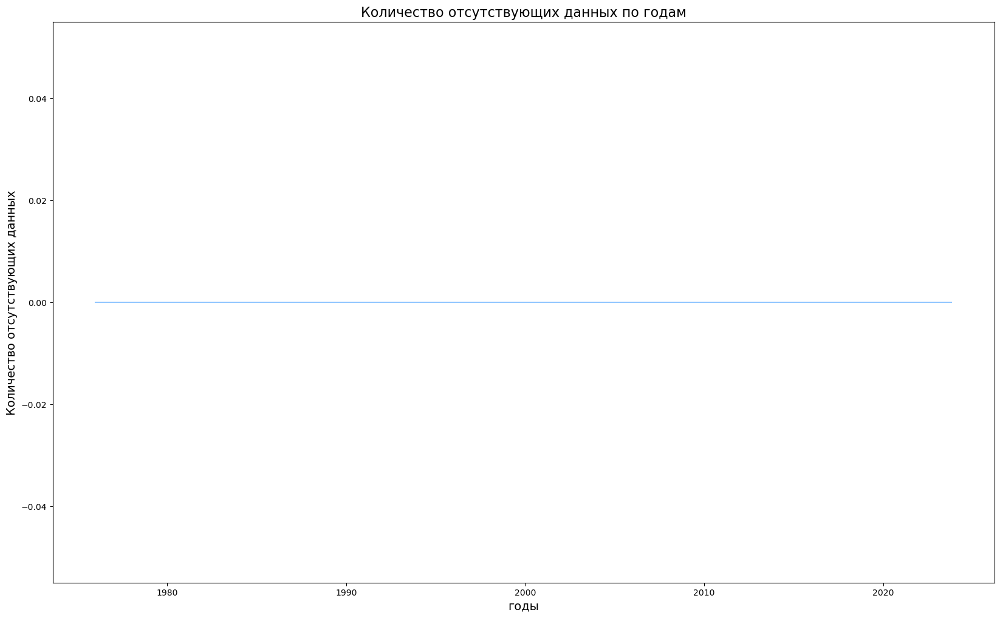

In [52]:
plt.figure(figsize=(20,12))

plt.plot(unmp_states.isna().sum(axis = 1))

plt.title('Количество отсутствующих данных по годам', size = 16)
plt.xlabel('годы', size = 14)
plt.ylabel('Количество отсутствующих данных', size = 14)
plt.show

In [53]:
# посмотрим на глобальный график по всем штатам
# видим очень яркий всплеск во время Ковида

# Матплотлиб получился плохо с точки зрения информативности
# давайте посмотрим с помощью Плотли

<function matplotlib.pyplot.show(close=None, block=None)>

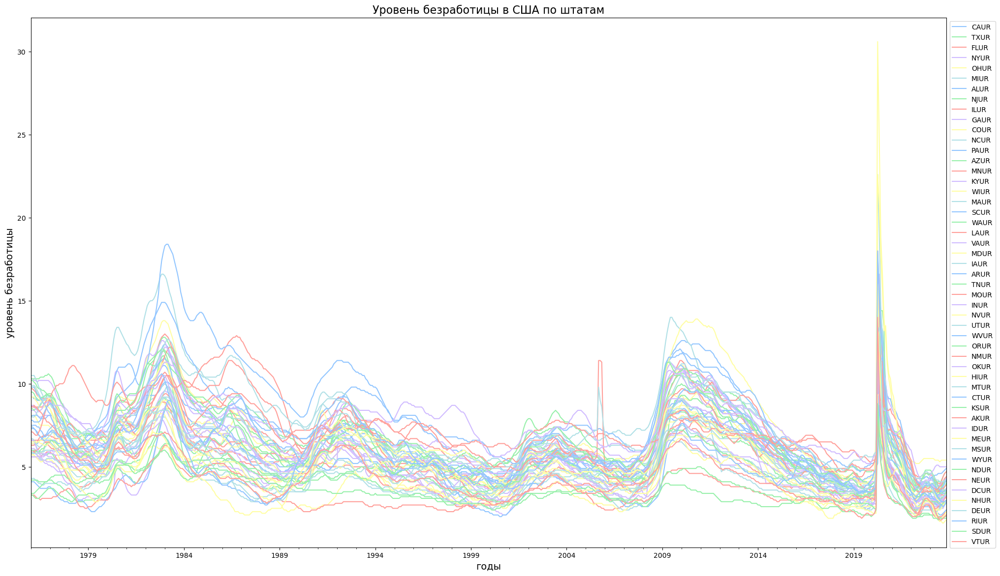

In [54]:
unmp_states.plot(figsize = (24,14))

plt.title('Уровень безработицы в США по штатам', size = 16)
plt.xlabel('годы', size = 14)
plt.ylabel('уровень безработицы', size = 14)
plt.legend(bbox_to_anchor=(1,1))
plt.show

In [55]:
# Ковидный максимум у нас в Неваде (NVUR)
# глобальный тренд - на спад

In [56]:
px.line(unmp_states, width = 980, height = 600)

In [57]:
# пик пришелся на апрель 2020, если верить графику
# давайте сделаем график на каждый штат за это время

# для начала подготовим данные
# возьмём начало апреля 2020 и трансформируем график
# дополнительно сделаем сортировку данных на увеличение

In [58]:
unmp_states.loc[unmp_states.index == '2020-04-01'].T.sort_values('2020-04-01')

,2020-04-01
WYUR,5.2
NEUR,8.1
CTUR,8.2
NDUR,8.7
SDUR,8.8
MNUR,8.8
NMUR,9.0
MDUR,9.0
MEUR,9.3
UTUR,10.0


In [59]:
# построим горизонтальный бар график
# в лидерах Невада, Гаваи и Мичиган

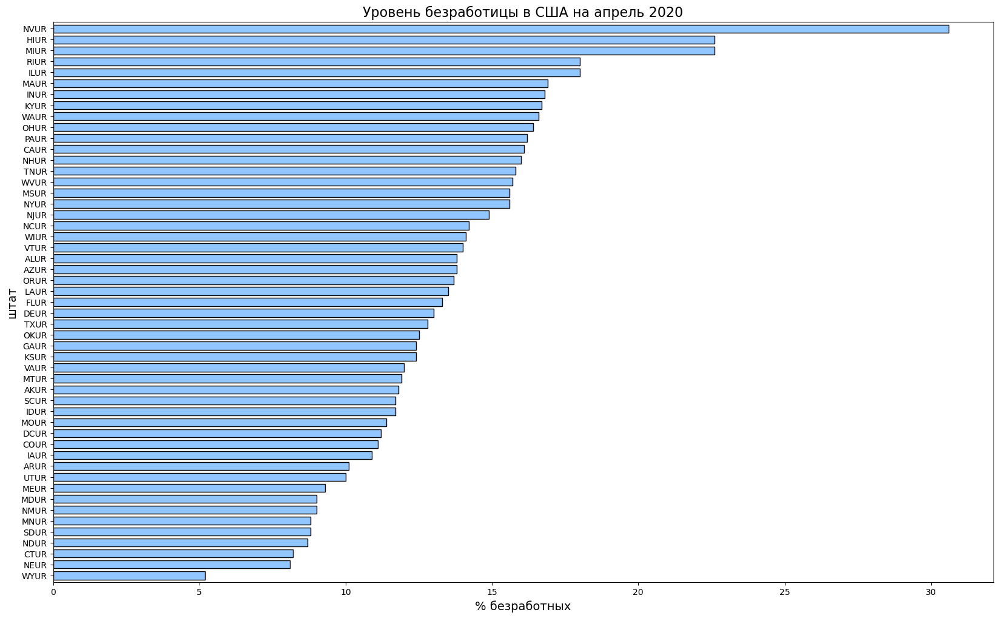

In [60]:
ax = unmp_states.loc[unmp_states.index == '2020-04-01'].T.sort_values('2020-04-01').plot(kind = 'barh',
                                                                                   figsize = (20,12), 
                                                                                   width = 0.75, edgecolor = 'black')
ax.legend().remove()
plt.title('Уровень безработицы в США на апрель 2020', size = 16)
plt.xlabel('% безработных', size = 14)
plt.ylabel('штат', size = 14)
plt.show()

In [61]:
# меня смущают аббревиатуры, хочется увидеть там полноценные названия штатов
# попробуем решить данный вопрос
# вернемся к основному ДФу

# в колонке title у нас есть описание данных
# в них есть закономерность: во всех случаях присутствует Unemployment Rate in с пробелом, а далее указан сам штат

In [62]:
unmp_df['title']

series id
CAUR                  Unemployment Rate in California
TXUR                       Unemployment Rate in Texas
FLUR                     Unemployment Rate in Florida
NYUR                    Unemployment Rate in New York
OHUR                        Unemployment Rate in Ohio
MIUR                    Unemployment Rate in Michigan
ALUR                     Unemployment Rate in Alabama
NJUR                  Unemployment Rate in New Jersey
ILUR                    Unemployment Rate in Illinois
GAUR                     Unemployment Rate in Georgia
COUR                    Unemployment Rate in Colorado
NCUR              Unemployment Rate in North Carolina
PAUR                Unemployment Rate in Pennsylvania
AZUR                     Unemployment Rate in Arizona
MNUR                   Unemployment Rate in Minnesota
KYUR                    Unemployment Rate in Kentucky
WIUR                   Unemployment Rate in Wisconsin
MAUR               Unemployment Rate in Massachusetts
SCUR              

In [63]:
# уберем лишние из данные в столбце, чтобы осталось только название штата с помощью строчного метода

In [64]:
unmp_df['title'].str.replace('Unemployment Rate in ', '')

series id
CAUR                  California
TXUR                       Texas
FLUR                     Florida
NYUR                    New York
OHUR                        Ohio
MIUR                    Michigan
ALUR                     Alabama
NJUR                  New Jersey
ILUR                    Illinois
GAUR                     Georgia
COUR                    Colorado
NCUR              North Carolina
PAUR                Pennsylvania
AZUR                     Arizona
MNUR                   Minnesota
KYUR                    Kentucky
WIUR                   Wisconsin
MAUR               Massachusetts
SCUR              South Carolina
WAUR                  Washington
LAUR                   Louisiana
VAUR                    Virginia
MDUR                    Maryland
IAUR                        Iowa
ARUR                    Arkansas
TNUR                   Tennessee
MOUR                    Missouri
INUR                     Indiana
NVUR                      Nevada
UTUR                        Utah


In [65]:
# для дальнейшей работы удобнее всего сохранить эти данные в словарь
# теперь их можно сопоставить

In [66]:
ids_and_states = unmp_df['title'].str.replace('Unemployment Rate in ', '').to_dict()
ids_and_states

{'CAUR': 'California',
 'TXUR': 'Texas',
 'FLUR': 'Florida',
 'NYUR': 'New York',
 'OHUR': 'Ohio',
 'MIUR': 'Michigan',
 'ALUR': 'Alabama',
 'NJUR': 'New Jersey',
 'ILUR': 'Illinois',
 'GAUR': 'Georgia',
 'COUR': 'Colorado',
 'NCUR': 'North Carolina',
 'PAUR': 'Pennsylvania',
 'AZUR': 'Arizona',
 'MNUR': 'Minnesota',
 'KYUR': 'Kentucky',
 'WIUR': 'Wisconsin',
 'MAUR': 'Massachusetts',
 'SCUR': 'South Carolina',
 'WAUR': 'Washington',
 'LAUR': 'Louisiana',
 'VAUR': 'Virginia',
 'MDUR': 'Maryland',
 'IAUR': 'Iowa',
 'ARUR': 'Arkansas',
 'TNUR': 'Tennessee',
 'MOUR': 'Missouri',
 'INUR': 'Indiana',
 'NVUR': 'Nevada',
 'UTUR': 'Utah',
 'WVUR': 'West Virginia',
 'ORUR': 'Oregon',
 'NMUR': 'New Mexico',
 'OKUR': 'Oklahoma',
 'HIUR': 'Hawaii',
 'MTUR': 'Montana',
 'CTUR': 'Connecticut',
 'KSUR': 'Kansas',
 'AKUR': 'Alaska',
 'IDUR': 'Idaho',
 'MEUR': 'Maine',
 'MSUR': 'Mississippi',
 'WYUR': 'Wyoming',
 'NDUR': 'North Dakota',
 'NEUR': 'Nebraska',
 'DCUR': 'the District of Columbia',
 'NHUR':

In [67]:
# будем использовать этот словарь для замены данных в ДФе unmp_states

In [68]:
for states in unmp_states.columns:
    print(ids_and_states[states])

California
Texas
Florida
New York
Ohio
Michigan
Alabama
New Jersey
Illinois
Georgia
Colorado
North Carolina
Pennsylvania
Arizona
Minnesota
Kentucky
Wisconsin
Massachusetts
South Carolina
Washington
Louisiana
Virginia
Maryland
Iowa
Arkansas
Tennessee
Missouri
Indiana
Nevada
Utah
West Virginia
Oregon
New Mexico
Oklahoma
Hawaii
Montana
Connecticut
Kansas
Alaska
Idaho
Maine
Mississippi
Wyoming
North Dakota
Nebraska
the District of Columbia
New Hampshire
Delaware
Rhode Island
South Dakota
Vermont


In [69]:
# сделаем генераторное выражение и сохраним данные
# далее обновим несколько графиков

In [70]:
unmp_states.columns = [ids_and_states[states] for states in unmp_states.columns]
unmp_states

,California,Texas,Florida,New York,Ohio,Michigan,Alabama,New Jersey,Illinois,Georgia,Colorado,North Carolina,Pennsylvania,Arizona,Minnesota,Kentucky,Wisconsin,Massachusetts,South Carolina,Washington,Louisiana,Virginia,Maryland,Iowa,Arkansas,Tennessee,Missouri,Indiana,Nevada,Utah,West Virginia,Oregon,New Mexico,Oklahoma,Hawaii,Montana,Connecticut,Kansas,Alaska,Idaho,Maine,Mississippi,Wyoming,North Dakota,Nebraska,the District of Columbia,New Hampshire,Delaware,Rhode Island,South Dakota,Vermont
1976-01-01,9.2,5.8,9.7,10.3,8.1,9.9,6.6,10.3,6.6,8.4,5.8,6.4,8.0,10.2,6.0,5.6,5.8,10.5,7.4,8.5,6.3,6.1,6.4,4.3,7.3,6.0,5.9,6.6,9.2,5.8,7.5,9.5,8.6,5.8,9.8,5.8,9.8,4.2,7.1,5.6,8.7,6.7,4.1,3.4,3.3,8.7,6.5,8.0,7.8,3.3,8.6
1976-02-01,9.2,5.8,9.7,10.3,8.1,9.9,6.6,10.3,6.6,8.4,5.7,6.4,8.1,10.2,6.0,5.6,5.8,10.5,7.4,8.5,6.3,6.1,6.4,4.3,7.3,6.0,5.9,6.6,9.2,5.9,7.5,9.5,8.7,5.8,9.8,5.8,9.8,4.2,7.1,5.6,8.7,6.7,4.1,3.4,3.3,8.7,6.5,8.0,7.8,3.3,8.6
1976-03-01,9.1,5.9,9.6,10.2,8.1,9.9,6.6,10.3,6.6,8.4,5.7,6.4,8.1,10.1,5.9,5.6,5.7,10.5,7.3,8.4,6.3,6.1,6.4,4.3,7.3,6.0,5.9,6.5,9.2,5.8,7.5,9.4,8.7,5.8,9.8,5.8,9.8,4.2,7.0,5.6,8.6,6.6,4.1,3.4,3.3,8.6,6.5,8.0,7.7,3.2,8.6
1976-04-01,9.1,5.9,9.5,10.2,8.0,9.8,6.5,10.3,6.6,8.3,5.6,6.3,8.1,10.0,5.8,5.6,5.6,10.3,7.2,8.5,6.4,6.0,6.4,4.2,7.2,6.0,6.0,6.3,9.0,5.8,7.5,9.2,8.6,5.8,9.7,5.8,9.6,4.2,6.9,5.6,8.6,6.4,4.0,3.5,3.2,8.5,6.5,8.1,7.7,3.1,8.6
1976-05-01,9.0,5.9,9.3,10.1,7.8,9.6,6.4,10.3,6.6,8.1,5.6,6.1,8.1,9.8,5.7,5.5,5.5,10.1,7.0,8.5,6.5,5.9,6.5,4.1,7.1,5.9,6.0,6.0,8.9,5.7,7.4,9.1,8.6,5.7,9.4,5.8,9.4,4.2,6.9,5.6,8.5,6.3,3.9,3.6,3.1,8.4,6.5,8.3,7.7,3.1,8.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-01,4.6,4.1,2.7,3.9,3.3,3.6,2.1,3.9,4.0,3.2,2.9,3.3,3.5,3.6,3.0,3.9,2.6,2.5,3.1,3.6,3.4,2.5,1.8,2.7,2.6,3.1,2.7,3.3,5.3,2.4,3.4,3.4,3.6,2.7,2.8,2.5,3.6,2.7,3.8,2.8,2.4,3.0,3.0,2.0,2.0,5.0,1.7,4.1,2.8,1.9,1.8
2023-08-01,4.6,4.1,2.7,3.9,3.4,3.7,2.1,4.2,4.1,3.3,3.1,3.3,3.5,3.8,3.1,4.0,2.9,2.6,3.0,3.6,3.3,2.5,1.7,2.9,2.7,3.1,2.8,3.4,5.4,2.5,3.6,3.4,3.7,2.8,2.8,2.5,3.5,2.7,3.9,3.0,2.5,3.2,2.9,1.9,2.0,5.0,1.8,4.1,2.7,1.9,1.8
2023-09-01,4.7,4.1,2.8,4.0,3.4,3.9,2.2,4.4,4.4,3.4,3.2,3.4,3.4,4.0,3.1,4.1,3.1,2.6,2.9,3.6,3.3,2.5,1.6,3.0,2.9,3.2,2.9,3.6,5.4,2.6,3.8,3.5,3.7,3.0,2.8,2.7,3.5,2.8,4.1,3.1,2.7,3.2,2.9,1.9,2.1,5.0,2.0,4.1,2.6,1.9,1.9
2023-10-01,4.8,4.1,2.8,4.2,3.6,4.1,2.3,4.6,4.6,3.4,3.3,3.4,3.4,4.2,3.2,4.2,3.2,2.8,2.9,3.8,3.3,2.7,1.7,3.2,3.1,3.3,3.1,3.6,5.4,2.7,4.0,3.6,3.8,3.2,2.9,2.8,3.5,2.9,4.3,3.2,2.8,3.3,2.9,1.9,2.2,5.0,2.1,4.2,2.7,2.0,2.0


In [71]:
# давайте попробуем сделать алфавитный порядок по штатам США

In [72]:
unmp_states = unmp_states.reindex(sorted(unmp_states.columns), axis=1)
unmp_states

,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,Missouri,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming,the District of Columbia
1976-01-01,6.6,7.1,10.2,7.3,9.2,5.8,9.8,8.0,9.7,8.4,9.8,5.6,6.6,6.6,4.3,4.2,5.6,6.3,8.7,6.4,10.5,9.9,6.0,6.7,5.9,5.8,3.3,9.2,6.5,10.3,8.6,10.3,6.4,3.4,8.1,5.8,9.5,8.0,7.8,7.4,3.3,6.0,5.8,5.8,8.6,6.1,8.5,7.5,5.8,4.1,8.7
1976-02-01,6.6,7.1,10.2,7.3,9.2,5.7,9.8,8.0,9.7,8.4,9.8,5.6,6.6,6.6,4.3,4.2,5.6,6.3,8.7,6.4,10.5,9.9,6.0,6.7,5.9,5.8,3.3,9.2,6.5,10.3,8.7,10.3,6.4,3.4,8.1,5.8,9.5,8.1,7.8,7.4,3.3,6.0,5.8,5.9,8.6,6.1,8.5,7.5,5.8,4.1,8.7
1976-03-01,6.6,7.0,10.1,7.3,9.1,5.7,9.8,8.0,9.6,8.4,9.8,5.6,6.6,6.5,4.3,4.2,5.6,6.3,8.6,6.4,10.5,9.9,5.9,6.6,5.9,5.8,3.3,9.2,6.5,10.3,8.7,10.2,6.4,3.4,8.1,5.8,9.4,8.1,7.7,7.3,3.2,6.0,5.9,5.8,8.6,6.1,8.4,7.5,5.7,4.1,8.6
1976-04-01,6.5,6.9,10.0,7.2,9.1,5.6,9.6,8.1,9.5,8.3,9.7,5.6,6.6,6.3,4.2,4.2,5.6,6.4,8.6,6.4,10.3,9.8,5.8,6.4,6.0,5.8,3.2,9.0,6.5,10.3,8.6,10.2,6.3,3.5,8.0,5.8,9.2,8.1,7.7,7.2,3.1,6.0,5.9,5.8,8.6,6.0,8.5,7.5,5.6,4.0,8.5
1976-05-01,6.4,6.9,9.8,7.1,9.0,5.6,9.4,8.3,9.3,8.1,9.4,5.6,6.6,6.0,4.1,4.2,5.5,6.5,8.5,6.5,10.1,9.6,5.7,6.3,6.0,5.8,3.1,8.9,6.5,10.3,8.6,10.1,6.1,3.6,7.8,5.7,9.1,8.1,7.7,7.0,3.1,5.9,5.9,5.7,8.5,5.9,8.5,7.4,5.5,3.9,8.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-01,2.1,3.8,3.6,2.6,4.6,2.9,3.6,4.1,2.7,3.2,2.8,2.8,4.0,3.3,2.7,2.7,3.9,3.4,2.4,1.8,2.5,3.6,3.0,3.0,2.7,2.5,2.0,5.3,1.7,3.9,3.6,3.9,3.3,2.0,3.3,2.7,3.4,3.5,2.8,3.1,1.9,3.1,4.1,2.4,1.8,2.5,3.6,3.4,2.6,3.0,5.0
2023-08-01,2.1,3.9,3.8,2.7,4.6,3.1,3.5,4.1,2.7,3.3,2.8,3.0,4.1,3.4,2.9,2.7,4.0,3.3,2.5,1.7,2.6,3.7,3.1,3.2,2.8,2.5,2.0,5.4,1.8,4.2,3.7,3.9,3.3,1.9,3.4,2.8,3.4,3.5,2.7,3.0,1.9,3.1,4.1,2.5,1.8,2.5,3.6,3.6,2.9,2.9,5.0
2023-09-01,2.2,4.1,4.0,2.9,4.7,3.2,3.5,4.1,2.8,3.4,2.8,3.1,4.4,3.6,3.0,2.8,4.1,3.3,2.7,1.6,2.6,3.9,3.1,3.2,2.9,2.7,2.1,5.4,2.0,4.4,3.7,4.0,3.4,1.9,3.4,3.0,3.5,3.4,2.6,2.9,1.9,3.2,4.1,2.6,1.9,2.5,3.6,3.8,3.1,2.9,5.0
2023-10-01,2.3,4.3,4.2,3.1,4.8,3.3,3.5,4.2,2.8,3.4,2.9,3.2,4.6,3.6,3.2,2.9,4.2,3.3,2.8,1.7,2.8,4.1,3.2,3.3,3.1,2.8,2.2,5.4,2.1,4.6,3.8,4.2,3.4,1.9,3.6,3.2,3.6,3.4,2.7,2.9,2.0,3.3,4.1,2.7,2.0,2.7,3.8,4.0,3.2,2.9,5.0


<function matplotlib.pyplot.show(close=None, block=None)>

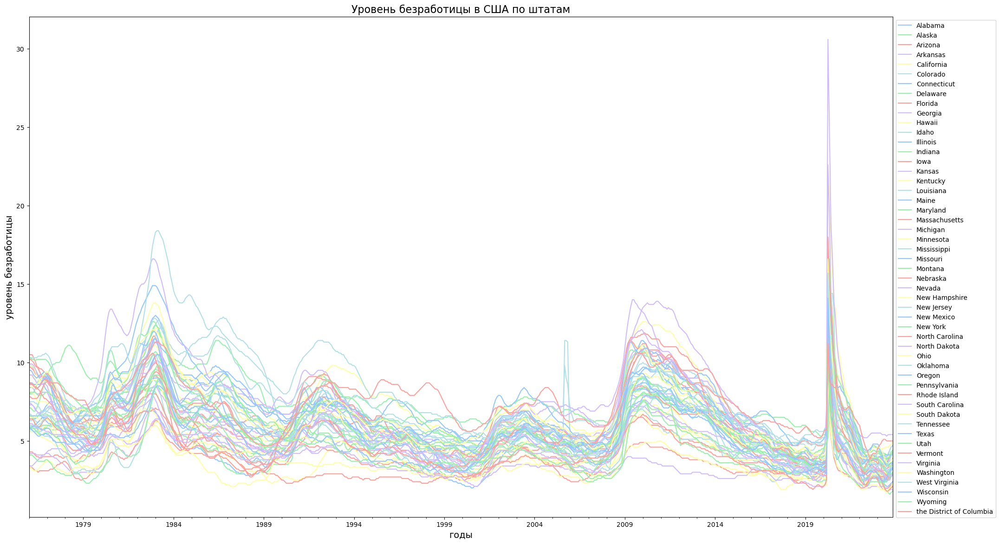

In [73]:
unmp_states.plot(figsize = (24,14))

plt.title('Уровень безработицы в США по штатам', size = 16)
plt.xlabel('годы', size = 14)
plt.ylabel('уровень безработицы', size = 14)
plt.legend(bbox_to_anchor=(1,1))
plt.show

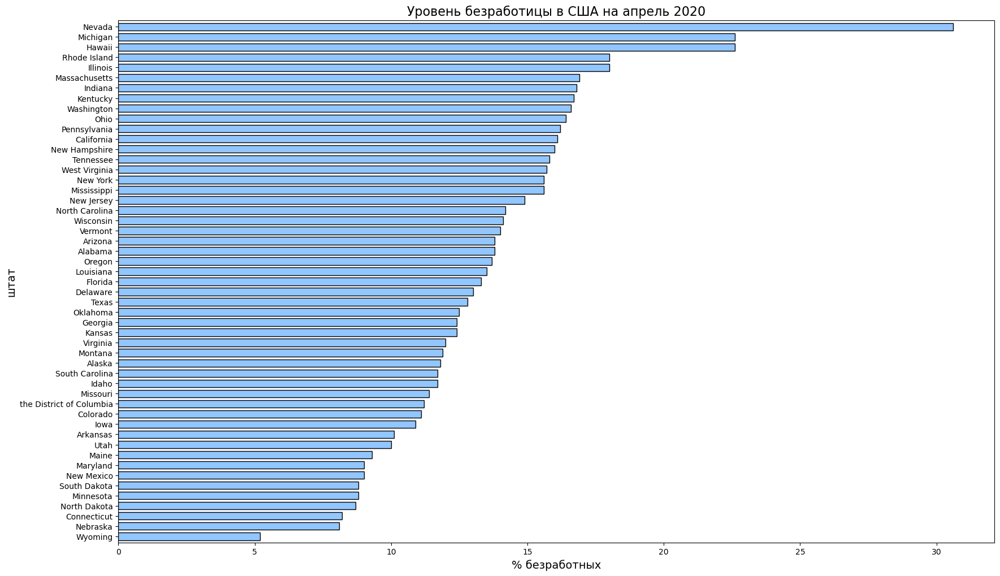

In [74]:
ax = unmp_states.loc[unmp_states.index == '2020-04-01'].T.sort_values('2020-04-01').plot(kind = 'barh',
                                                                                   figsize = (20,12), 
                                                                                   width = 0.75, edgecolor = 'black')
ax.legend().remove()
plt.title('Уровень безработицы в США на апрель 2020', size = 16)
plt.xlabel('% безработных', size = 14)
plt.ylabel('штат', size = 14)
plt.show()

In [75]:
# давайте посмотрим на другой показатель - participation rate state
# коэффициент участия – процентная доля людей трудоспособного возраста, входящих в состав рабочей силы
# насколько я понял, это люди, которые работают или активно ищут работу

# сделаем новый запрос на основе старых

In [76]:
# нам нужно будет проделать схожия действия, которые мы осуществляли при работе с данными по безработице

In [77]:
participation = fred.search('participation rate state', filter = ('frequency', 'Monthly'))
participation = participation.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')

In [78]:
# разница заключается в том, что нам нужны серии, в ай ди которых присутствует LBSSA
# это я выяснил отдельно, проведя некоторое время на сайте FRED

# уберем все лишние записи из ДФа с помошью цикла

In [79]:
for col in participation['id']:
    if 'LBSSA' not in col:
        participation = participation.drop(col)
        
len(participation)

51

In [80]:
# названия столбцов тоже придется изменить, подготовим сырье
# в этот раз нужно отрезать другую часть из описания - Labor Force Participation Rate for 
# сохраним всё в словарь

In [81]:
state_participation = participation['title'].str.replace('Labor Force Participation Rate for ', '').to_dict()
state_participation

{'LBSSA06': 'California',
 'LBSSA26': 'Michigan',
 'LBSSA36': 'New York',
 'LBSSA01': 'Alabama',
 'LBSSA12': 'Florida',
 'LBSSA24': 'Maryland',
 'LBSSA48': 'Texas',
 'LBSSA42': 'Pennsylvania',
 'LBSSA27': 'Minnesota',
 'LBSSA21': 'Kentucky',
 'LBSSA55': 'Wisconsin',
 'LBSSA39': 'Ohio',
 'LBSSA54': 'West Virginia',
 'LBSSA35': 'New Mexico',
 'LBSSA28': 'Mississippi',
 'LBSSA08': 'Colorado',
 'LBSSA37': 'North Carolina',
 'LBSSA13': 'Georgia',
 'LBSSA49': 'Utah',
 'LBSSA25': 'Massachusetts',
 'LBSSA51': 'Virginia',
 'LBSSA22': 'Louisiana',
 'LBSSA33': 'New Hampshire',
 'LBSSA19': 'Iowa',
 'LBSSA23': 'Maine',
 'LBSSA17': 'Illinois',
 'LBSSA47': 'Tennessee',
 'LBSSA02': 'Alaska',
 'LBSSA50': 'Vermont',
 'LBSSA34': 'New Jersey',
 'LBSSA16': 'Idaho',
 'LBSSA38': 'North Dakota',
 'LBSSA29': 'Missouri',
 'LBSSA04': 'Arizona',
 'LBSSA18': 'Indiana',
 'LBSSA40': 'Oklahoma',
 'LBSSA09': 'Connecticut',
 'LBSSA45': 'South Carolina',
 'LBSSA20': 'Kansas',
 'LBSSA53': 'Washington',
 'LBSSA41': 'Orego

In [82]:
# получим серии по всем штатам в разрезе вовлеченности населения в рабочие процессы через цикл
# принцип остался без изменений

In [83]:
all_participation = []

for my_id in participation.index:
    results = fred.get_series(my_id)
    results = results.to_frame(name = my_id)
    all_participation.append(results)

In [84]:
all_participation

[            LBSSA06
 1976-01-01     62.6
 1976-02-01     62.4
 1976-03-01     62.2
 1976-04-01     62.2
 1976-05-01     62.3
 ...             ...
 2023-07-01     62.4
 2023-08-01     62.4
 2023-09-01     62.3
 2023-10-01     62.3
 2023-11-01     62.2
 
 [575 rows x 1 columns],
             LBSSA26
 1976-01-01     61.6
 1976-02-01     61.5
 1976-03-01     61.5
 1976-04-01     61.6
 1976-05-01     61.7
 ...             ...
 2023-07-01     61.0
 2023-08-01     61.3
 2023-09-01     61.6
 2023-10-01     61.8
 2023-11-01     62.1
 
 [575 rows x 1 columns],
             LBSSA36
 1976-01-01     58.0
 1976-02-01     58.0
 1976-03-01     58.0
 1976-04-01     58.0
 1976-05-01     58.1
 ...             ...
 2023-07-01     61.4
 2023-08-01     61.5
 2023-09-01     61.6
 2023-10-01     61.6
 2023-11-01     61.7
 
 [575 rows x 1 columns],
             LBSSA01
 1976-01-01     57.0
 1976-02-01     56.9
 1976-03-01     56.8
 1976-04-01     56.8
 1976-05-01     56.8
 ...             ...
 2023-07-01     

In [85]:
# сделаем глобальный ДФ из полученных серий

In [86]:
participation_states = pd.concat(all_participation, axis = 1)
participation_states

,LBSSA06,LBSSA26,LBSSA36,LBSSA01,LBSSA12,LBSSA24,LBSSA48,LBSSA42,LBSSA27,LBSSA21,LBSSA55,LBSSA39,LBSSA54,LBSSA35,LBSSA28,LBSSA08,LBSSA37,LBSSA13,LBSSA49,LBSSA25,LBSSA51,LBSSA22,LBSSA33,LBSSA19,LBSSA23,LBSSA17,LBSSA47,LBSSA02,LBSSA50,LBSSA34,LBSSA16,LBSSA38,LBSSA29,LBSSA04,LBSSA18,LBSSA40,LBSSA09,LBSSA45,LBSSA20,LBSSA53,LBSSA41,LBSSA31,LBSSA46,LBSSA10,LBSSA05,LBSSA32,LBSSA30,LBSSA56,LBSSA15,LBSSA11,LBSSA44
1976-01-01,62.6,61.6,58.0,57.0,55.8,64.3,63.8,58.4,65.6,60.5,65.6,61.7,52.5,60.8,58.8,67.2,66.5,63.7,62.8,64.8,65.9,56.8,65.9,64.4,62.1,63.0,59.6,69.0,63.6,61.5,63.0,62.6,60.5,59.5,64.0,59.3,64.2,65.3,65.1,60.9,62.9,64.9,64.6,62.7,57.9,71.3,62.7,65.3,69.9,64.4,63.8
1976-02-01,62.4,61.5,58.0,56.9,55.7,64.2,63.5,58.3,65.5,60.3,65.5,61.7,52.4,60.5,58.6,67.0,66.3,63.6,62.6,64.7,65.8,56.6,65.6,64.3,61.9,63.0,59.4,68.4,63.4,61.4,62.8,62.4,60.3,59.2,63.9,59.2,64.1,65.2,65.0,60.7,62.7,64.9,64.4,62.5,57.8,70.8,62.5,64.9,69.6,64.5,63.7
1976-03-01,62.2,61.5,58.0,56.8,55.5,64.1,63.4,58.3,65.4,60.2,65.4,61.7,52.3,60.3,58.5,66.8,66.2,63.5,62.5,64.6,65.6,56.5,65.6,64.2,61.9,62.9,59.3,67.8,63.2,61.4,62.7,62.3,60.3,59.1,63.8,59.1,64.0,65.0,64.9,60.6,62.5,64.8,64.4,62.5,57.7,70.5,62.4,64.7,69.6,64.5,63.6
1976-04-01,62.2,61.6,58.0,56.8,55.5,64.1,63.5,58.3,65.4,60.1,65.4,61.6,52.3,60.3,58.5,66.6,66.2,63.5,62.5,64.6,65.5,56.4,65.7,64.1,61.8,62.9,59.3,67.9,63.5,61.5,62.7,62.5,60.4,59.1,63.8,59.0,64.1,64.9,65.0,60.6,62.4,64.8,64.3,62.4,57.7,70.4,62.3,64.9,69.4,64.5,63.7
1976-05-01,62.3,61.7,58.1,56.8,55.4,64.1,63.6,58.3,65.5,60.1,65.5,61.6,52.2,60.3,58.5,66.5,66.3,63.6,62.6,64.6,65.4,56.4,66.0,64.1,61.7,63.0,59.4,67.9,63.6,61.6,62.8,62.6,60.6,59.1,63.9,59.0,64.3,64.7,65.1,60.7,62.5,64.8,64.3,62.4,57.7,70.5,62.2,65.2,69.3,64.4,63.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-01,62.4,61.0,61.4,57.0,59.7,65.3,64.2,61.9,68.5,57.7,65.5,62.1,54.7,57.1,54.4,68.7,60.7,61.4,69.8,64.5,66.7,59.3,64.9,68.8,58.5,64.4,59.4,65.2,63.9,65.5,62.4,69.7,63.6,61.8,63.6,61.6,64.1,56.9,66.8,64.7,61.8,69.4,67.8,60.1,57.7,61.6,62.7,64.6,60.3,70.8,63.3
2023-08-01,62.4,61.3,61.5,57.0,59.7,65.3,64.2,61.9,68.5,57.6,65.7,62.1,54.9,57.2,54.3,68.7,60.8,61.4,69.8,64.5,66.7,59.0,64.6,68.7,58.6,64.4,59.4,65.2,64.0,65.5,62.4,69.5,63.7,61.8,63.5,61.8,64.1,57.0,66.7,64.6,61.7,69.2,67.8,60.3,57.7,61.7,62.7,64.5,60.2,70.9,63.3
2023-09-01,62.3,61.6,61.6,57.0,59.8,65.2,64.2,61.9,68.5,57.4,65.8,62.1,55.1,57.2,54.1,68.6,60.9,61.5,69.7,64.4,66.8,58.9,64.6,68.6,58.7,64.5,59.4,65.2,64.1,65.4,62.4,69.3,63.7,61.9,63.4,62.1,64.1,57.0,66.7,64.5,61.7,69.2,67.8,60.5,57.8,61.9,62.6,64.4,60.2,71.1,63.4
2023-10-01,62.3,61.8,61.6,57.0,59.8,65.2,64.2,61.9,68.5,57.3,65.8,62.0,55.2,57.2,53.9,68.4,60.9,61.6,69.6,64.5,66.8,58.8,64.7,68.4,58.8,64.5,59.4,65.1,64.2,65.2,62.4,69.2,63.6,62.0,63.3,62.3,64.1,57.0,66.7,64.3,61.7,69.1,67.8,60.6,57.8,62.1,62.6,64.2,60.1,71.4,63.5


In [87]:
# теперь изменим названия колонок генераторным выражением и добавим сортировку

In [88]:
participation_states.columns = [state_participation[states] for states in participation_states.columns]
participation_states = participation_states.reindex(sorted(participation_states.columns), axis=1)
participation_states

,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District Of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,Missouri,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
1976-01-01,57.0,69.0,59.5,57.9,62.6,67.2,64.2,62.7,64.4,55.8,63.7,69.9,63.0,63.0,64.0,64.4,65.1,60.5,56.8,62.1,64.3,64.8,61.6,65.6,58.8,60.5,62.7,64.9,71.3,65.9,61.5,60.8,58.0,66.5,62.6,61.7,59.3,62.9,58.4,63.8,65.3,64.6,59.6,63.8,62.8,63.6,65.9,60.9,52.5,65.6,65.3
1976-02-01,56.9,68.4,59.2,57.8,62.4,67.0,64.1,62.5,64.5,55.7,63.6,69.6,62.8,63.0,63.9,64.3,65.0,60.3,56.6,61.9,64.2,64.7,61.5,65.5,58.6,60.3,62.5,64.9,70.8,65.6,61.4,60.5,58.0,66.3,62.4,61.7,59.2,62.7,58.3,63.7,65.2,64.4,59.4,63.5,62.6,63.4,65.8,60.7,52.4,65.5,64.9
1976-03-01,56.8,67.8,59.1,57.7,62.2,66.8,64.0,62.5,64.5,55.5,63.5,69.6,62.7,62.9,63.8,64.2,64.9,60.2,56.5,61.9,64.1,64.6,61.5,65.4,58.5,60.3,62.4,64.8,70.5,65.6,61.4,60.3,58.0,66.2,62.3,61.7,59.1,62.5,58.3,63.6,65.0,64.4,59.3,63.4,62.5,63.2,65.6,60.6,52.3,65.4,64.7
1976-04-01,56.8,67.9,59.1,57.7,62.2,66.6,64.1,62.4,64.5,55.5,63.5,69.4,62.7,62.9,63.8,64.1,65.0,60.1,56.4,61.8,64.1,64.6,61.6,65.4,58.5,60.4,62.3,64.8,70.4,65.7,61.5,60.3,58.0,66.2,62.5,61.6,59.0,62.4,58.3,63.7,64.9,64.3,59.3,63.5,62.5,63.5,65.5,60.6,52.3,65.4,64.9
1976-05-01,56.8,67.9,59.1,57.7,62.3,66.5,64.3,62.4,64.4,55.4,63.6,69.3,62.8,63.0,63.9,64.1,65.1,60.1,56.4,61.7,64.1,64.6,61.7,65.5,58.5,60.6,62.2,64.8,70.5,66.0,61.6,60.3,58.1,66.3,62.6,61.6,59.0,62.5,58.3,63.6,64.7,64.3,59.4,63.6,62.6,63.6,65.4,60.7,52.2,65.5,65.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-01,57.0,65.2,61.8,57.7,62.4,68.7,64.1,60.1,70.8,59.7,61.4,60.3,62.4,64.4,63.6,68.8,66.8,57.7,59.3,58.5,65.3,64.5,61.0,68.5,54.4,63.6,62.7,69.4,61.6,64.9,65.5,57.1,61.4,60.7,69.7,62.1,61.6,61.8,61.9,63.3,56.9,67.8,59.4,64.2,69.8,63.9,66.7,64.7,54.7,65.5,64.6
2023-08-01,57.0,65.2,61.8,57.7,62.4,68.7,64.1,60.3,70.9,59.7,61.4,60.2,62.4,64.4,63.5,68.7,66.7,57.6,59.0,58.6,65.3,64.5,61.3,68.5,54.3,63.7,62.7,69.2,61.7,64.6,65.5,57.2,61.5,60.8,69.5,62.1,61.8,61.7,61.9,63.3,57.0,67.8,59.4,64.2,69.8,64.0,66.7,64.6,54.9,65.7,64.5
2023-09-01,57.0,65.2,61.9,57.8,62.3,68.6,64.1,60.5,71.1,59.8,61.5,60.2,62.4,64.5,63.4,68.6,66.7,57.4,58.9,58.7,65.2,64.4,61.6,68.5,54.1,63.7,62.6,69.2,61.9,64.6,65.4,57.2,61.6,60.9,69.3,62.1,62.1,61.7,61.9,63.4,57.0,67.8,59.4,64.2,69.7,64.1,66.8,64.5,55.1,65.8,64.4
2023-10-01,57.0,65.1,62.0,57.8,62.3,68.4,64.1,60.6,71.4,59.8,61.6,60.1,62.4,64.5,63.3,68.4,66.7,57.3,58.8,58.8,65.2,64.5,61.8,68.5,53.9,63.6,62.6,69.1,62.1,64.7,65.2,57.2,61.6,60.9,69.2,62.0,62.3,61.7,61.9,63.5,57.0,67.8,59.4,64.2,69.6,64.2,66.8,64.3,55.2,65.8,64.2


In [89]:
# теперь у нас есть 2 ДФа, которые мы попробуем наложить друг на друга
# unmp_states и participation_states

# возьмём временной отрезок с 2020 по ноябрь 2024

In [90]:
# давайте попробуем это сделать на примере одного штата

In [91]:
# возьмем уровень безработицы в Калифорнии за интересующий промежуток

<Axes: title={'center': 'Уровень безработицы в Калифорнии'}>

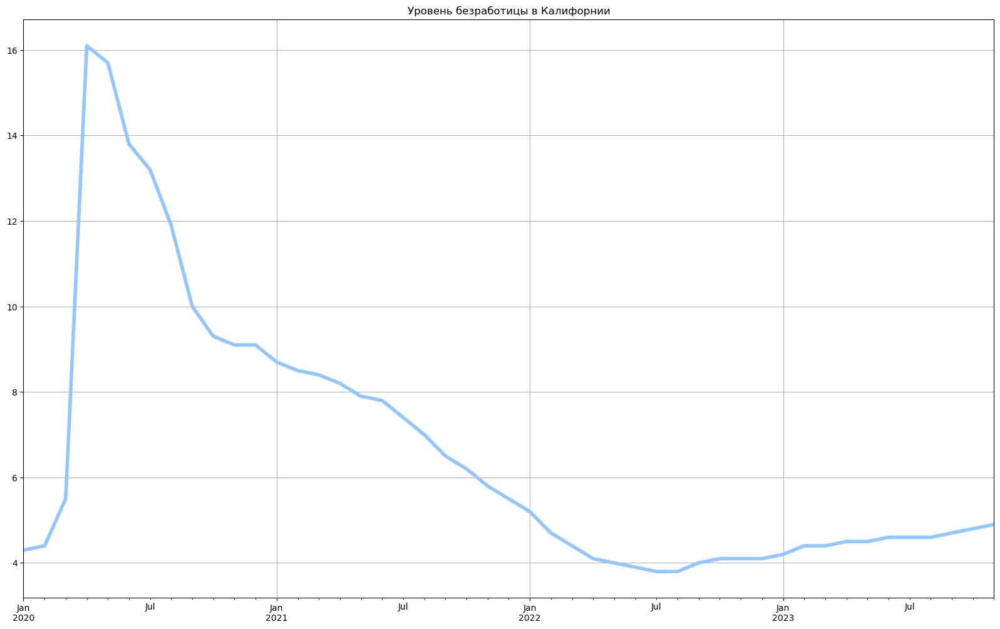

In [92]:
unmp_states.query('index >= 2020')['California'].plot(figsize = (20,12), 
                                                      title = 'Уровень безработицы в Калифорнии', 
                                                      linewidth = 4, 
                                                      grid = True)

In [93]:
# возьмем вовлеченность населения в Калифорнии за интересующий промежуток

<Axes: title={'center': 'Коэффициент участия населения Калифорнии'}>

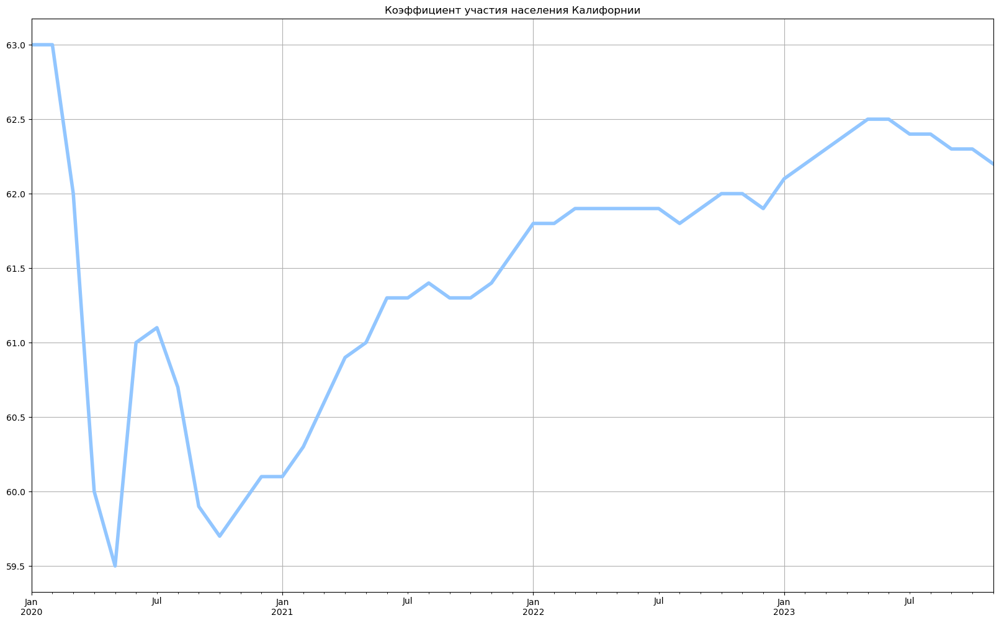

In [94]:
participation_states.query('index >= 2020')['California'].plot(figsize = (20,12), 
                                                      title = 'Коэффициент участия населения Калифорнии', 
                                                      linewidth = 4, 
                                                      grid = True)

In [95]:
# попробуем наложить один график на другой
# оси Икс одинаковые, оси Игрик разные

<Axes: title={'center': 'Соотношение уровня безработицы и уровня участия населения Калифорнии'}>

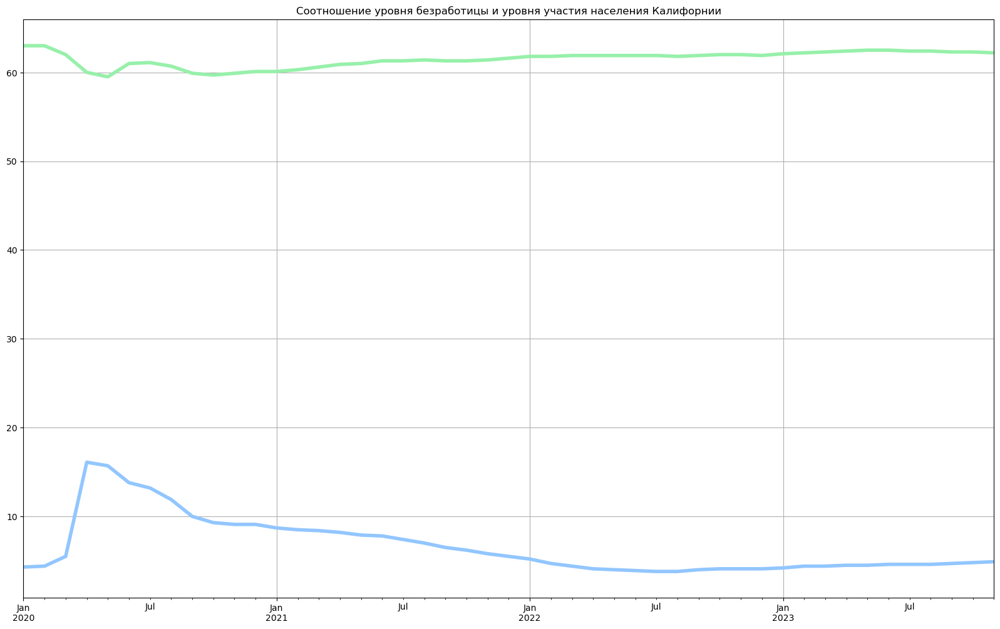

In [96]:
fig, ax = plt.subplots()

unmp_states.query('index >= 2020')['California'].plot(figsize = (20,12), 
                                                      linewidth = 4, 
                                                      ax = ax)

participation_states.query('index >= 2020')['California'].plot(figsize = (20,12), 
                                                      title = 'Соотношение уровня безработицы и уровня участия населения Калифорнии',
                                                      linewidth = 4, 
                                                      ax = ax, grid = True)

In [97]:
# сделаем немного другой график с несколькими Игрик осями

Text(0, 0.5, 'Вовлеченность населения')

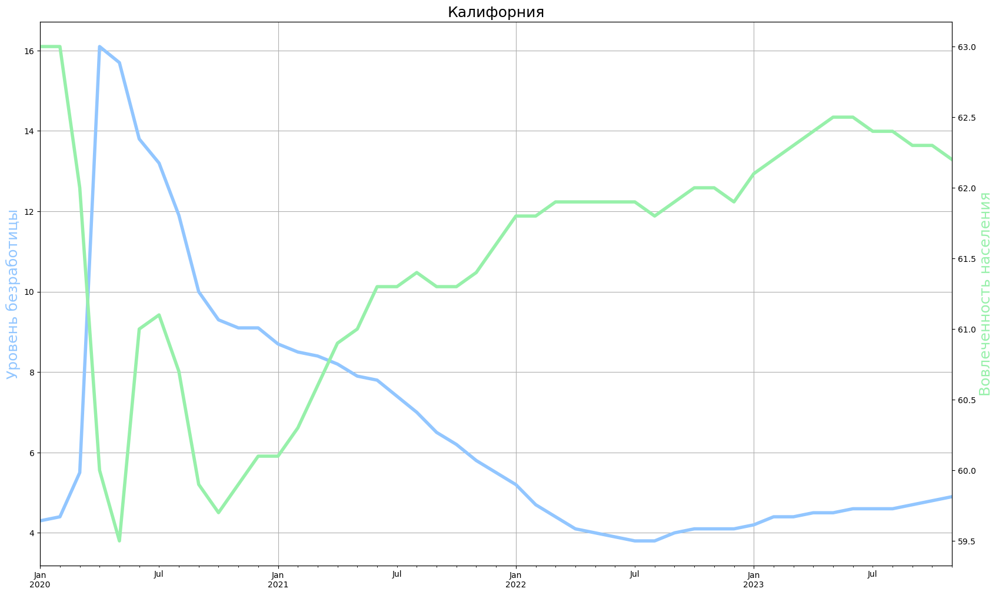

In [98]:
fig, ax = plt.subplots()
ax2 = ax.twinx()

unmp_states.query('index >= 2020')['California'].plot(figsize = (20,12), 
                                                      linewidth = 4, ax = ax, 
                                                      label = 'Уровень безработицы', 
                                                      grid = True)

participation_states.query('index >= 2020')['California'].plot(figsize = (20,12),
                                                      linewidth = 4, 
                                                      label = 'Вовлеченность населения',
                                                      ax = ax2, 
                                                      color = color_palette[1])
ax.set_title('Калифорния', fontsize= 18)
ax.set_ylabel('Уровень безработицы', fontsize= 18, color = color_palette[0])
ax2.set_ylabel('Вовлеченность населения', fontsize= 18, color = color_palette[1])

In [99]:
# давайте попробуем сделать подобные графики, но уже для всех штатов
# первым делом нам надо подготовить пространство под графики
# планируется 51 график

In [100]:
# fig, axs = plt.subplots(13, 4, figsize = (20, 34))
# axs = axs.flatten()

In [101]:
# в процессе работы появилась еще одна проблема, есть отличия в названиях штатов, это не давало строить графики
# после просмотра названий колонок, я выяснил, что округ Колумбия именуется немного по разному
# ДФ по безработице - the District of Columbia
# ДФ по вовлеченности населения - District Of Columbia

In [102]:
# сделаем изменение перед построением + сортировку, так как она сбилась

In [103]:
unmp_states.rename(columns = {'the District of Columbia':'District Of Columbia'}, inplace=True)

In [104]:
unmp_states = unmp_states.reindex(sorted(unmp_states.columns), axis=1)
unmp_states

,Alabama,Alaska,Arizona,Arkansas,California,Colorado,Connecticut,Delaware,District Of Columbia,Florida,Georgia,Hawaii,Idaho,Illinois,Indiana,Iowa,Kansas,Kentucky,Louisiana,Maine,Maryland,Massachusetts,Michigan,Minnesota,Mississippi,Missouri,Montana,Nebraska,Nevada,New Hampshire,New Jersey,New Mexico,New York,North Carolina,North Dakota,Ohio,Oklahoma,Oregon,Pennsylvania,Rhode Island,South Carolina,South Dakota,Tennessee,Texas,Utah,Vermont,Virginia,Washington,West Virginia,Wisconsin,Wyoming
1976-01-01,6.6,7.1,10.2,7.3,9.2,5.8,9.8,8.0,8.7,9.7,8.4,9.8,5.6,6.6,6.6,4.3,4.2,5.6,6.3,8.7,6.4,10.5,9.9,6.0,6.7,5.9,5.8,3.3,9.2,6.5,10.3,8.6,10.3,6.4,3.4,8.1,5.8,9.5,8.0,7.8,7.4,3.3,6.0,5.8,5.8,8.6,6.1,8.5,7.5,5.8,4.1
1976-02-01,6.6,7.1,10.2,7.3,9.2,5.7,9.8,8.0,8.7,9.7,8.4,9.8,5.6,6.6,6.6,4.3,4.2,5.6,6.3,8.7,6.4,10.5,9.9,6.0,6.7,5.9,5.8,3.3,9.2,6.5,10.3,8.7,10.3,6.4,3.4,8.1,5.8,9.5,8.1,7.8,7.4,3.3,6.0,5.8,5.9,8.6,6.1,8.5,7.5,5.8,4.1
1976-03-01,6.6,7.0,10.1,7.3,9.1,5.7,9.8,8.0,8.6,9.6,8.4,9.8,5.6,6.6,6.5,4.3,4.2,5.6,6.3,8.6,6.4,10.5,9.9,5.9,6.6,5.9,5.8,3.3,9.2,6.5,10.3,8.7,10.2,6.4,3.4,8.1,5.8,9.4,8.1,7.7,7.3,3.2,6.0,5.9,5.8,8.6,6.1,8.4,7.5,5.7,4.1
1976-04-01,6.5,6.9,10.0,7.2,9.1,5.6,9.6,8.1,8.5,9.5,8.3,9.7,5.6,6.6,6.3,4.2,4.2,5.6,6.4,8.6,6.4,10.3,9.8,5.8,6.4,6.0,5.8,3.2,9.0,6.5,10.3,8.6,10.2,6.3,3.5,8.0,5.8,9.2,8.1,7.7,7.2,3.1,6.0,5.9,5.8,8.6,6.0,8.5,7.5,5.6,4.0
1976-05-01,6.4,6.9,9.8,7.1,9.0,5.6,9.4,8.3,8.4,9.3,8.1,9.4,5.6,6.6,6.0,4.1,4.2,5.5,6.5,8.5,6.5,10.1,9.6,5.7,6.3,6.0,5.8,3.1,8.9,6.5,10.3,8.6,10.1,6.1,3.6,7.8,5.7,9.1,8.1,7.7,7.0,3.1,5.9,5.9,5.7,8.5,5.9,8.5,7.4,5.5,3.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-01,2.1,3.8,3.6,2.6,4.6,2.9,3.6,4.1,5.0,2.7,3.2,2.8,2.8,4.0,3.3,2.7,2.7,3.9,3.4,2.4,1.8,2.5,3.6,3.0,3.0,2.7,2.5,2.0,5.3,1.7,3.9,3.6,3.9,3.3,2.0,3.3,2.7,3.4,3.5,2.8,3.1,1.9,3.1,4.1,2.4,1.8,2.5,3.6,3.4,2.6,3.0
2023-08-01,2.1,3.9,3.8,2.7,4.6,3.1,3.5,4.1,5.0,2.7,3.3,2.8,3.0,4.1,3.4,2.9,2.7,4.0,3.3,2.5,1.7,2.6,3.7,3.1,3.2,2.8,2.5,2.0,5.4,1.8,4.2,3.7,3.9,3.3,1.9,3.4,2.8,3.4,3.5,2.7,3.0,1.9,3.1,4.1,2.5,1.8,2.5,3.6,3.6,2.9,2.9
2023-09-01,2.2,4.1,4.0,2.9,4.7,3.2,3.5,4.1,5.0,2.8,3.4,2.8,3.1,4.4,3.6,3.0,2.8,4.1,3.3,2.7,1.6,2.6,3.9,3.1,3.2,2.9,2.7,2.1,5.4,2.0,4.4,3.7,4.0,3.4,1.9,3.4,3.0,3.5,3.4,2.6,2.9,1.9,3.2,4.1,2.6,1.9,2.5,3.6,3.8,3.1,2.9
2023-10-01,2.3,4.3,4.2,3.1,4.8,3.3,3.5,4.2,5.0,2.8,3.4,2.9,3.2,4.6,3.6,3.2,2.9,4.2,3.3,2.8,1.7,2.8,4.1,3.2,3.3,3.1,2.8,2.2,5.4,2.1,4.6,3.8,4.2,3.4,1.9,3.6,3.2,3.6,3.4,2.7,2.9,2.0,3.3,4.1,2.7,2.0,2.7,3.8,4.0,3.2,2.9


In [105]:
# на этих графиках можно увидеть уровень безроботицы и оценить влияние вовлеченности населения
# последняя ячейка пустая, так как у нас всего 51 ДФ с каждой стороны
# можно убрать округ Колумбия, который принес проблем и сделать сетку 10 на 5, например

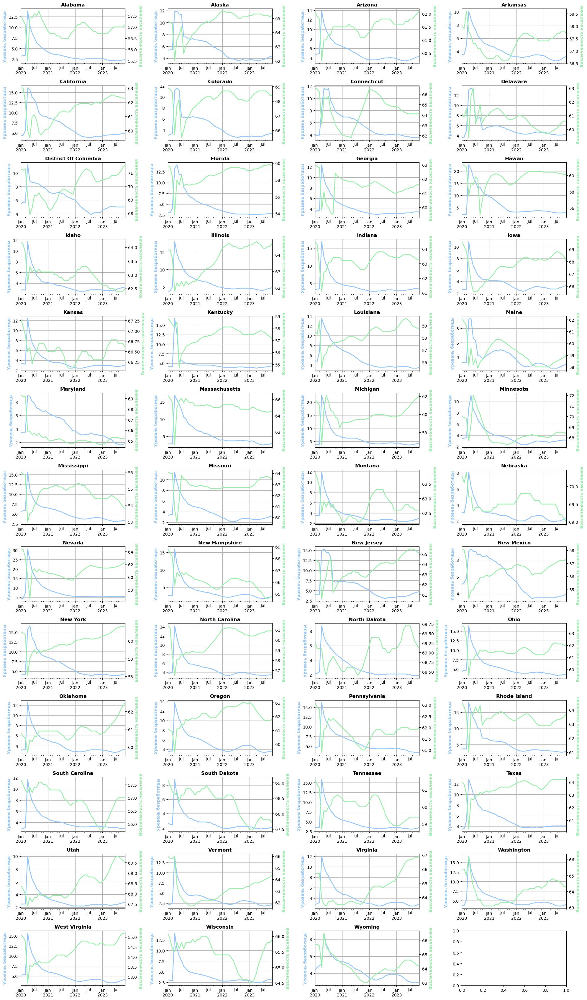

In [106]:
fig, axs = plt.subplots(13, 4, figsize = (20, 34))
axs = axs.flatten()


for counter, state in enumerate(unmp_states.columns):    
#     print(counter, state)
    ax2 = axs[counter].twinx()

    unmp_states.query('index >= 2020')[state].plot(linewidth = 2, 
                                                   ax = axs[counter], 
                                                   grid = True)

    participation_states.query('index >= 2020')[state].plot(linewidth = 2, 
                                                            ax = ax2, 
                                                            color = color_palette[1])
    axs[counter].set_title(state, 
                           weight = 'bold')
    axs[counter].set_ylabel('Уровень безработицы', 
                            color = color_palette[0], 
                            weight = 'bold')
    ax2.set_ylabel('Вовлеченность населения', 
                   color = color_palette[1], 
                   weight = 'bold')

plt.tight_layout()
plt.show()

In [107]:
fred_key.close()